In [101]:
import numpy as np
import tensorflow as tf
from tensorflow import keras
import os
import shutil
from keras import layers
from keras import models

print("TensorFlow version: " + tf.__version__)
print("Keras version: " + keras.__version__)
print(tf.config.list_physical_devices('GPU'))
print(tf.test.is_built_with_cuda)
print(tf.config.get_visible_devices())

TensorFlow version: 2.10.0
Keras version: 2.10.0
[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU'), PhysicalDevice(name='/physical_device:GPU:1', device_type='GPU')]
<function is_built_with_cuda at 0x0000021764FE89D0>
[PhysicalDevice(name='/physical_device:CPU:0', device_type='CPU'), PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU'), PhysicalDevice(name='/physical_device:GPU:1', device_type='GPU')]


Do wykonania tego zadania wybrałem model oparty na Leaky ReLU, który osiągnął największą skuteczność w Lab 2

In [102]:
from keras.models import load_model
# global graph
# graph = tf.compat.v1.get_default_graph()

base_dir = 'C:/ml/data/kaggle/processed/cats_and_dogs_small'

# The directory where we will store our models
# It can be downloaded from 'https://home.agh.edu.pl/~horzyk/ml/models/'
models_dir = 'C:/ml/models/'

model = load_model(models_dir + 'cats_and_dogs_small_top1.h5')

model.summary()  # Show a reminder of this model.

Model: "sequential_155"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_708 (Conv2D)         (None, 150, 150, 32)      896       
                                                                 
 max_pooling2d_705 (MaxPooli  (None, 75, 75, 32)       0         
 ng2D)                                                           
                                                                 
 conv2d_709 (Conv2D)         (None, 75, 75, 64)        18496     
                                                                 
 max_pooling2d_706 (MaxPooli  (None, 37, 37, 64)       0         
 ng2D)                                                           
                                                                 
 conv2d_710 (Conv2D)         (None, 37, 37, 128)       73856     
                                                                 
 max_pooling2d_707 (MaxPooli  (None, 18, 18, 128)   

In [103]:
import numpy as np
img_path = base_dir + '/test/cats/cat.1862.jpg'
from tensorflow.keras.preprocessing import image

img = image.load_img(img_path, target_size=(150, 150))
img_tensor = image.img_to_array(img)
img_tensor = np.expand_dims(img_tensor, axis=0)
# Remember that the model was trained on inputs that were preprocessed in the following way, so we must do the same now:
img_tensor /= 255.

# Its shape is (1, 150, 150, 3)
print(img_tensor.shape)

(1, 150, 150, 3)


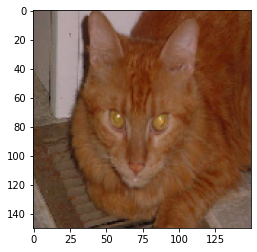

In [104]:
import matplotlib.pyplot as plt

plt.imshow(img_tensor[0])
plt.show()

In [105]:
from keras import models
layer_outputs = [layer.output for layer in model.layers[:8]]
activation_model = models.Model(inputs=model.input, outputs=layer_outputs)

In [106]:
activations = activation_model.predict(img_tensor)

In [107]:
first_layer_activation = activations[0]
print(first_layer_activation.shape)

(1, 150, 150, 32)


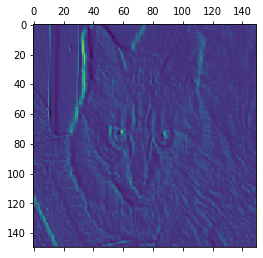

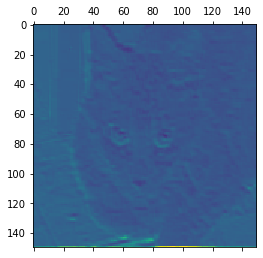

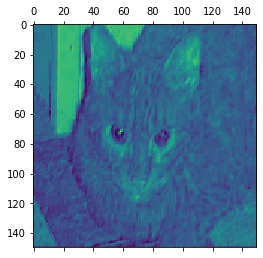

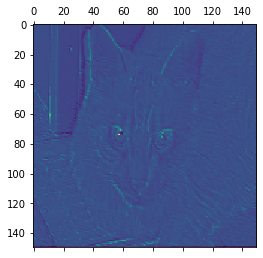

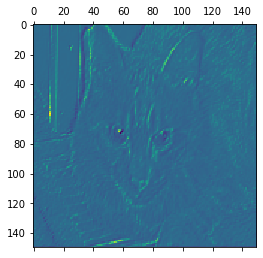

In [108]:
import matplotlib.pyplot as plt

plt.matshow(first_layer_activation[0, :, :, 0], cmap='viridis')
plt.show()
plt.matshow(first_layer_activation[0, :, :, 3], cmap='viridis')
plt.show()
plt.matshow(first_layer_activation[0, :, :, 6], cmap='viridis')
plt.show()
plt.matshow(first_layer_activation[0, :, :, 9], cmap='viridis')
plt.show()
plt.matshow(first_layer_activation[0, :, :, 12], cmap='viridis')
plt.show()

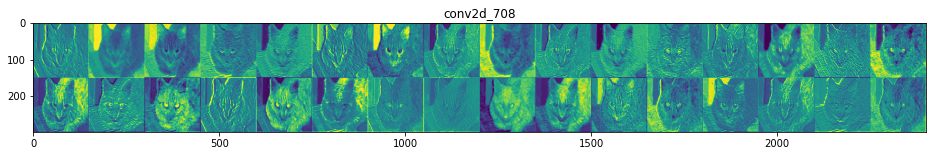

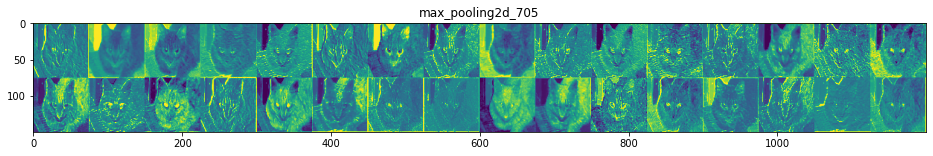

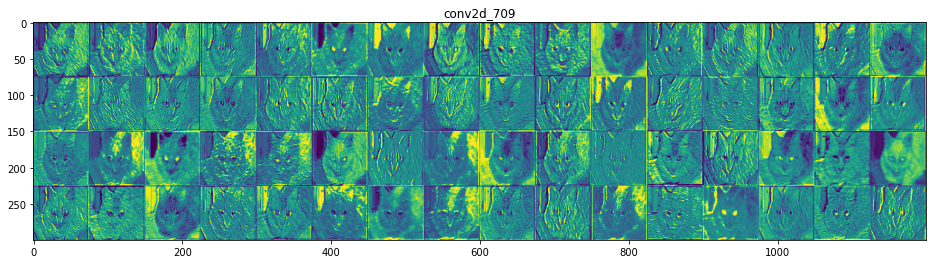

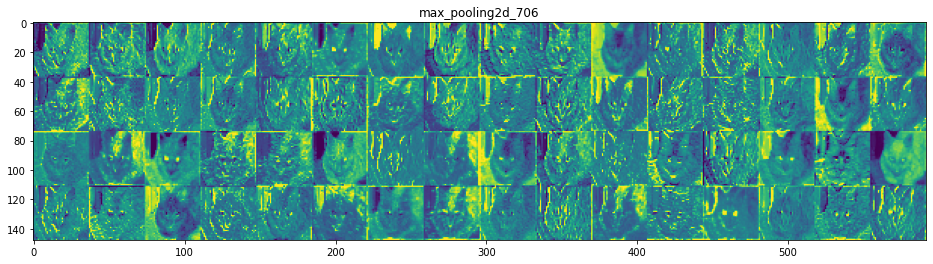

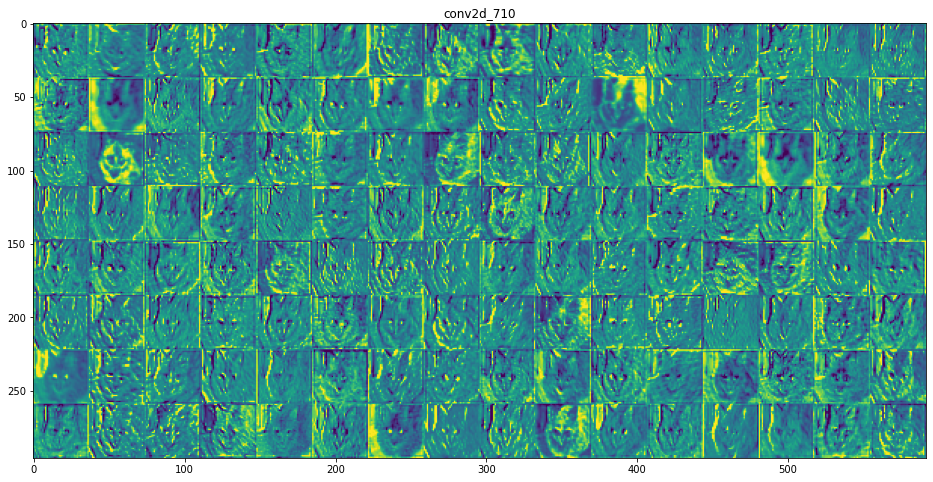

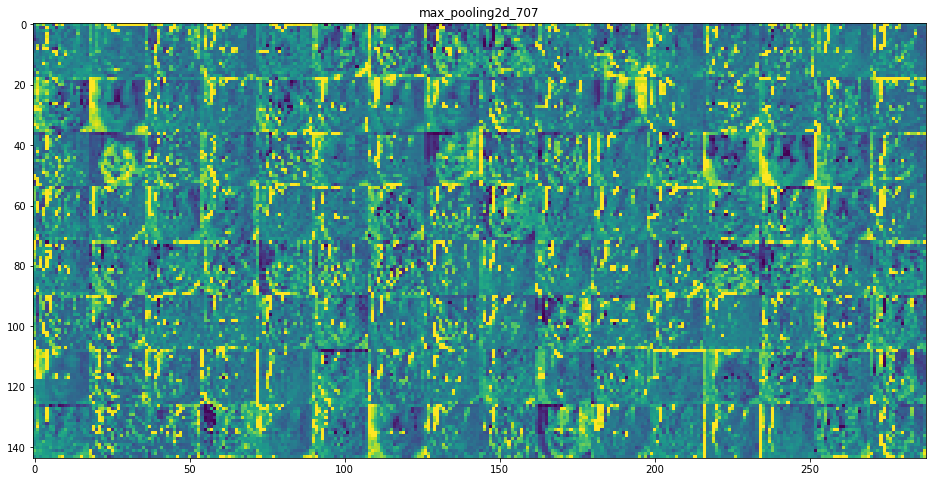

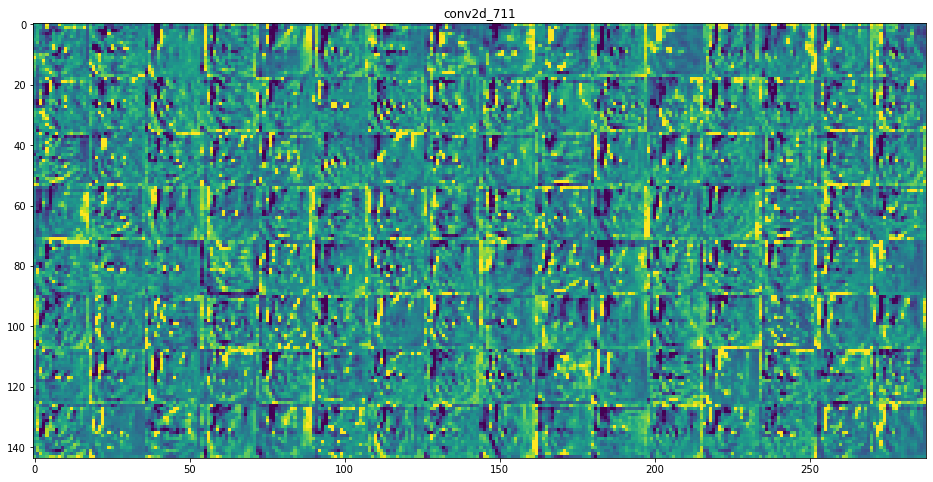

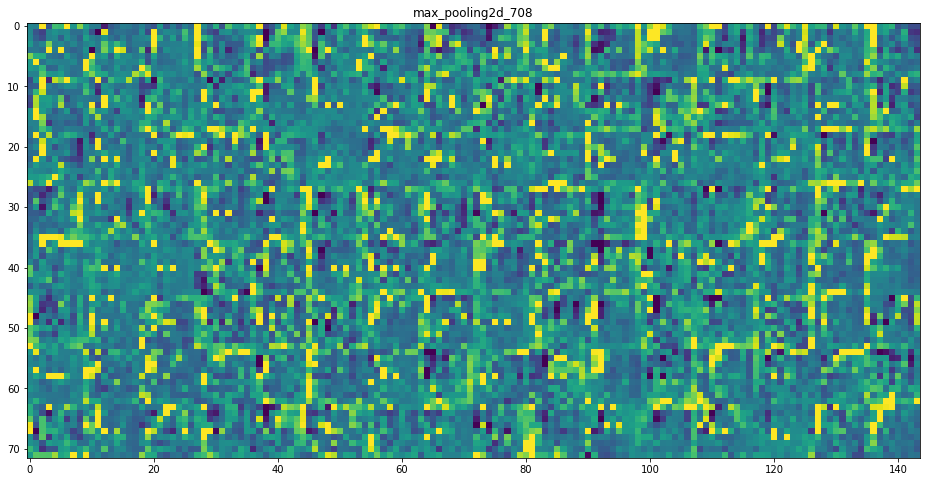

In [109]:
layer_names = []
for layer in model.layers[:8]:
    layer_names.append(layer.name)

images_per_row = 16

for layer_name, layer_activation in zip(layer_names, activations):
    n_features = layer_activation.shape[-1]

    size = layer_activation.shape[1]

    n_cols = n_features // images_per_row
    display_grid = np.zeros((size * n_cols, size * images_per_row))

    for col in range(n_cols):
        for row in range(images_per_row):
            channel_image = layer_activation[0, :, :, col * images_per_row + row] 
            channel_image -= channel_image.mean()
            channel_image /= channel_image.std()
            channel_image *= 64
            channel_image += 128
            channel_image = np.clip(channel_image, 0, 255).astype('uint8')
            display_grid[col * size : (col + 1) * size, row * size : (row + 1) * size] = channel_image

    scale = 1. / size
    plt.figure(figsize=(scale * display_grid.shape[1], scale * display_grid.shape[0]))
    plt.title(layer_name)
    plt.grid(False)
    plt.imshow(display_grid, aspect='auto', cmap='viridis')
    
plt.show()

# Wnioski
Prawdopodobnie dzięki temu, że używane jest Leaky ReLU, udało się osiągnąć zero martwych kanałów. Są one w większości zróżnicowane i szukają różnych cech, lecz istnieje kilka kanałów, które znajdują podobne cechy obrazu, także niewątpliwie można by się pokusić o czyszczenie.

Można zauważyć, że model dokładnie znajduje krawędzie w obrazie i intetrpretuje je w prawidłowy sposób. W całości unikamy "w większości martwych" aktywacji, co również świadczy o dobrym funkcjonowaniu.

In [92]:
from tensorflow.keras import backend as K
from tensorflow.keras.applications import VGG16
tf.compat.v1.disable_eager_execution()

layer_name = 'conv2d_711'
filter_index = 0

# model = VGG16(weights='imagenet', include_top=False)

# layer_name = 'block3_conv1'
# filter_index = 0

layer_output = model.get_layer(layer_name).output
print(layer_output)
feature_extractor = keras.Model(inputs=model.inputs, outputs=layer.output)
loss = K.mean(layer_output[:, :, :, filter_index])

Tensor("conv2d_711_1/leaky_re_lu_20/LeakyRelu:0", shape=(None, 18, 18, 128), dtype=float32)


In [29]:
grads = K.gradients(loss, model.input)[0]

In [30]:
grads /= (K.sqrt(K.mean(K.square(grads))) + 1e-5)

In [31]:
iterate = K.function([model.input], [loss, grads])

# Let's test it:
import numpy as np
loss_value, grads_value = iterate([np.zeros((1, 150, 150, 3))])

In [32]:
# We start from a gray image with some noise
input_img_data = np.random.random((1, 150, 150, 3)) * 20 + 128.

# Run gradient ascent for 40 steps
step = 1.  # this is the magnitude of each gradient update
for i in range(40):
    # Compute the loss value and gradient value
    loss_value, grads_value = iterate([input_img_data])
    # Here we adjust the input image in the direction that maximizes the loss
    input_img_data += grads_value * step

In [33]:
def deprocess_image(x):
    # normalize tensor: center on 0., ensure std is 0.1
    x -= x.mean()
    x /= (x.std() + 1e-5)
    x *= 0.1

    # clip to [0, 1]
    x += 0.5
    x = np.clip(x, 0, 1)

    # convert to RGB array
    x *= 255
    x = np.clip(x, 0, 255).astype('uint8')
    return x

def generate_pattern(layer_name, filter_index, size=150):
    # Build a loss function that maximizes the activation of the nth filter of the layer considered.
    layer_output = model.get_layer(layer_name).output
    loss = K.mean(layer_output[:, :, :, filter_index])

    # Compute the gradient of the input picture with this loss
    grads = K.gradients(loss, model.input)[0]

    # Normalization trick: we normalize the gradient
    grads /= (K.sqrt(K.mean(K.square(grads))) + 1e-5)

    # This function returns the loss and grads given the input picture
    iterate = K.function([model.input], [loss, grads])
    
    # We start from a gray image with some noise
    input_img_data = np.random.random((1, size, size, 3)) * 20 + 128.

    # Run gradient ascent for 40 steps
    step = 1.
    for i in range(40):
        loss_value, grads_value = iterate([input_img_data])
        input_img_data += grads_value * step
        
    img = input_img_data[0]
    return deprocess_image(img)

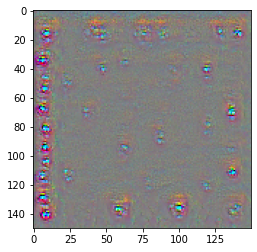

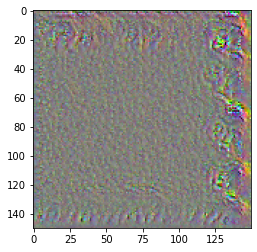

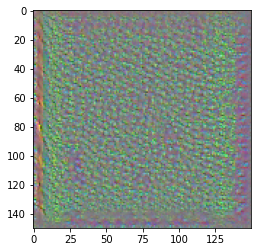

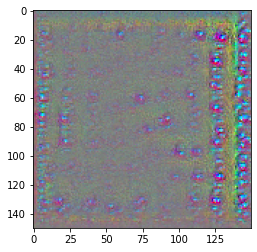

In [35]:
for i in range(4):
    plt.imshow(generate_pattern('conv2d_711', i))
    plt.show()

Layer name: conv2d_709


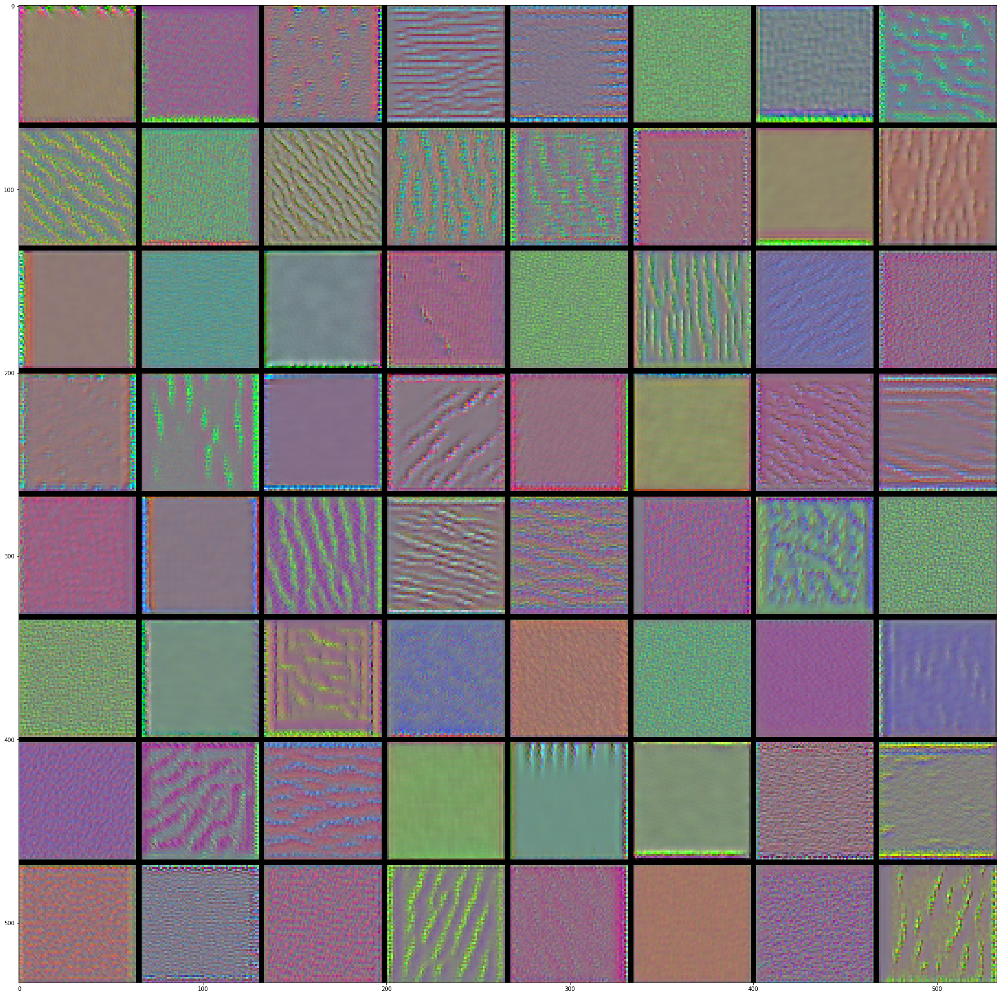

Layer name: conv2d_710


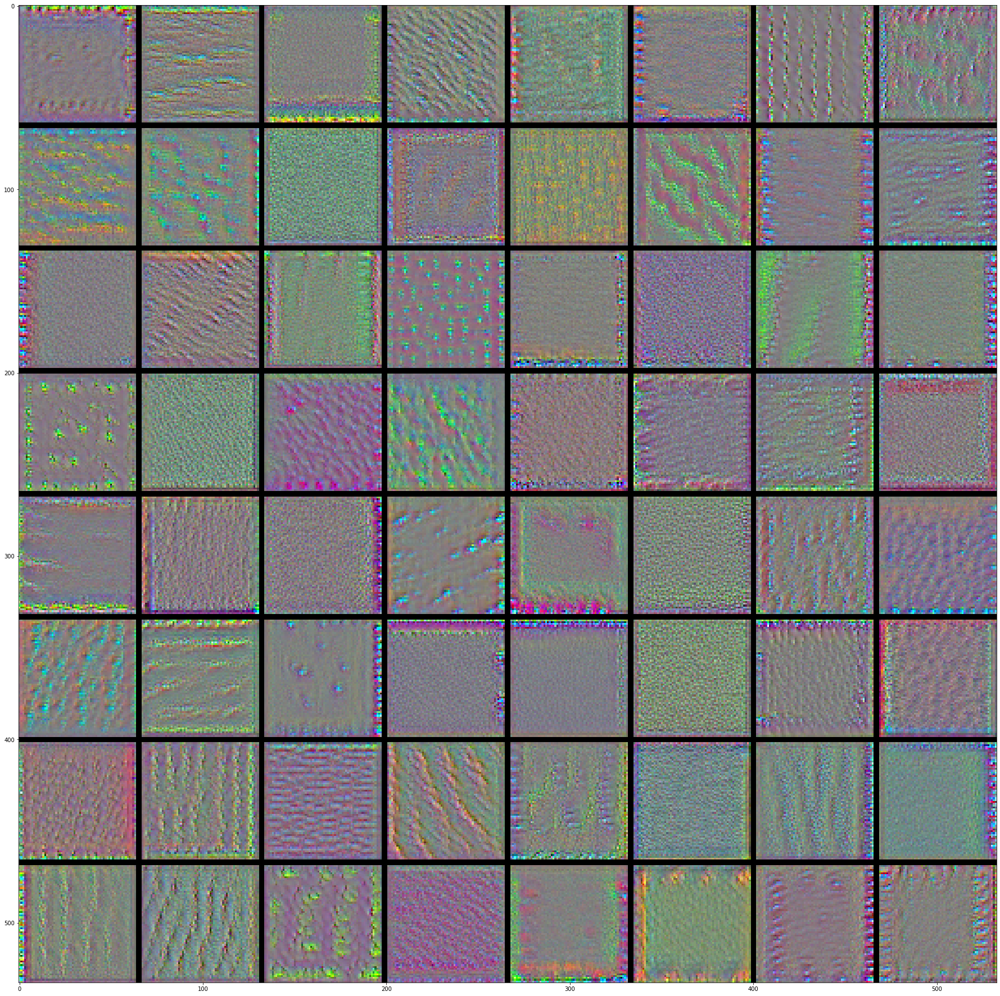

Layer name: conv2d_711


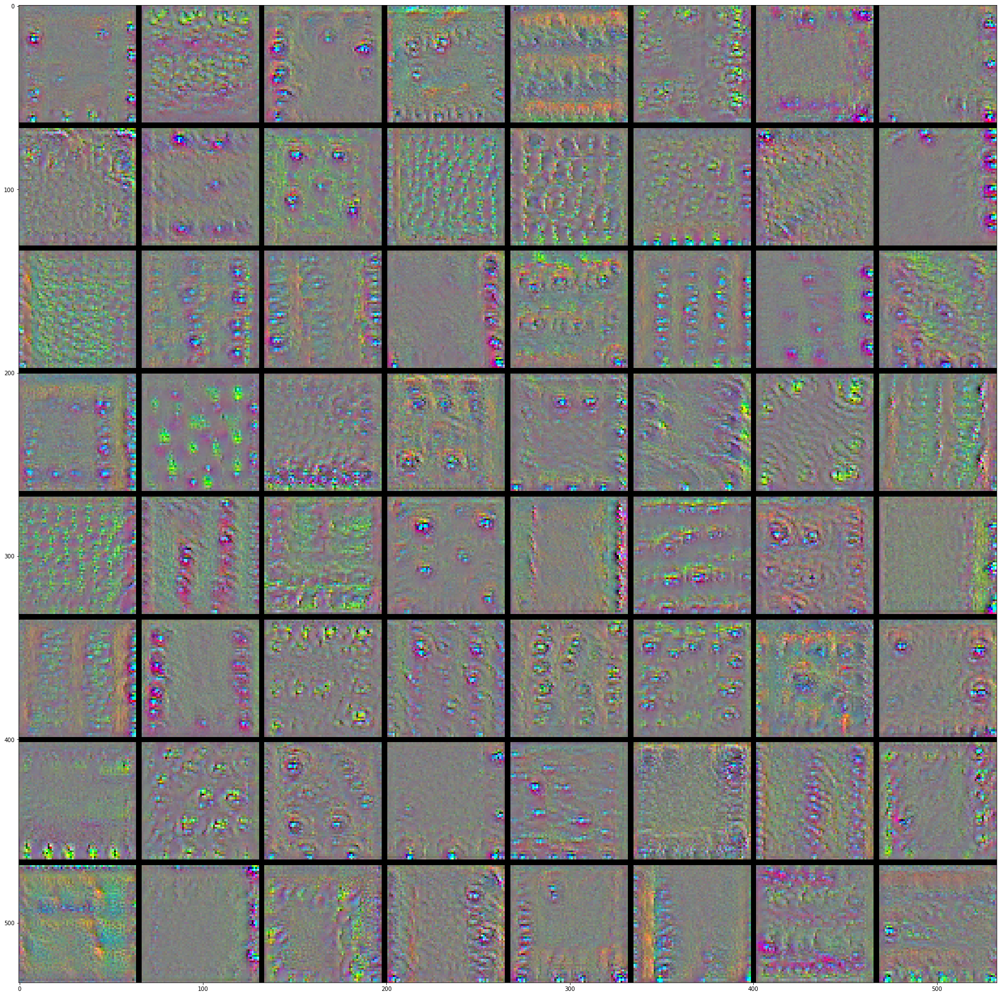

Layer name: conv2d_712


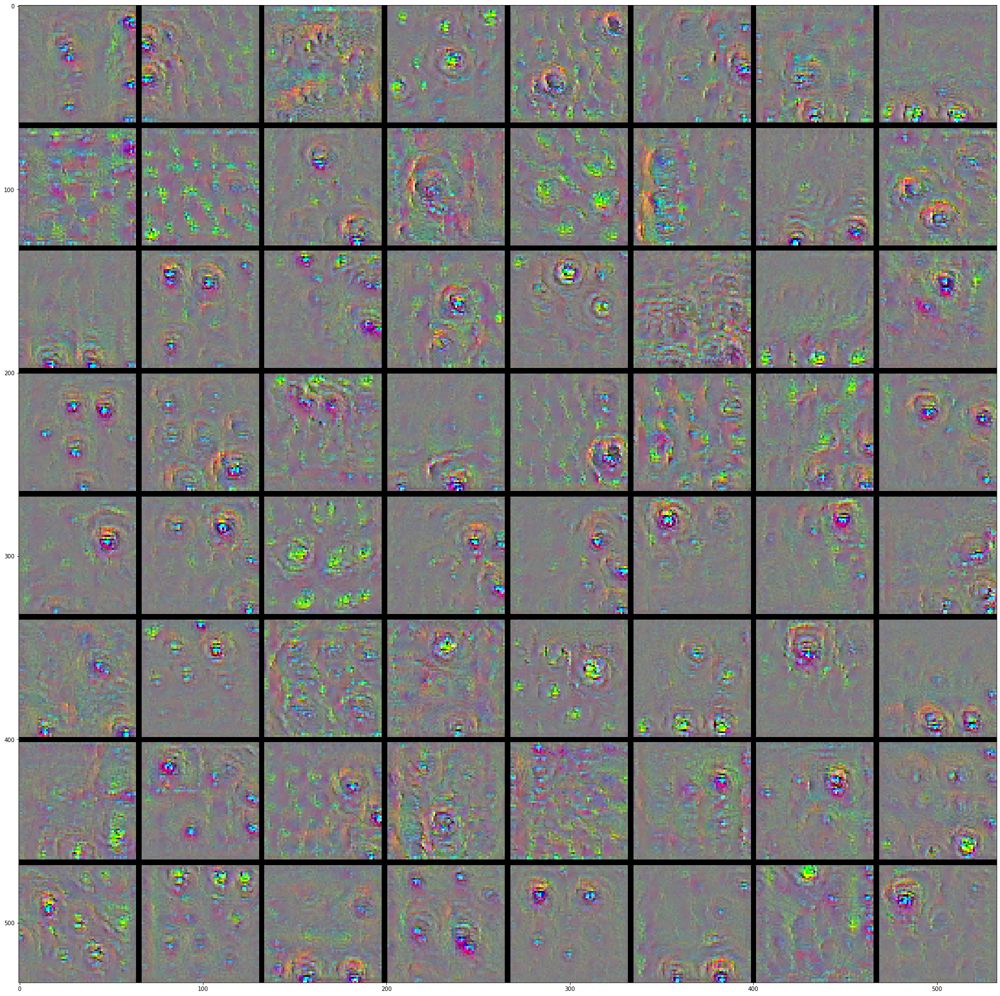

In [40]:
size = 64
margin = 3
no = 8

for layer_name in ['conv2d_709', 'conv2d_710', 'conv2d_711', 'conv2d_712']: 
    results = np.zeros((no * size + 7 * margin, no * size + 7 * margin, 3), dtype=np.uint8)

    for i in range(no):  # iterate over the rows of our results grid
        for j in range(no):  # iterate over the columns of our results grid
            # Generate the pattern for filter `i + (j * no)` in `layer_name`
            filter_img = generate_pattern(layer_name, i + (j * no), size=size)
            # Put the result in the square `(i, j)` of the results grid
            horizontal_start = i * size + i * margin
            horizontal_end = horizontal_start + size
            vertical_start = j * size + j * margin
            vertical_end = vertical_start + size
            results[horizontal_start : horizontal_end, vertical_start : vertical_end, : ] = filter_img

    # Display the results grid
    print("Layer name: " + layer_name)
    plt.figure(figsize=(size / 2, size / 2))
    plt.imshow(results)
    plt.show()

# Wnioski
Filtry tego modelu są w ciekawy sposób zróżnicowane, lecz jednocześnie wykrywają zwłaszcza konkretne obszary. Niemniej jednak brak jest filtrów z szumem, czyli sieć wytrenowana została w dobry sposób bez martwych filtrów.

In [94]:
K.clear_session()
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications.vgg16 import preprocess_input, decode_predictions
import numpy as np

img_path = base_dir + '/test/cats/cat.1863.jpg'

# `img` is a PIL image of size 224x224
img = image.load_img(img_path, target_size=(150, 150))

# `x` is a float32 Numpy array of shape (150, 150, 3)
x = image.img_to_array(img)

# We add a dimension to transform our array into a "batch" of size (1, 224, 224, 3)
x = np.expand_dims(x, axis=0)

# Finally we preprocess the batch (this does channel-wise color normalization)
# x = preprocess_input(x)
# x /= 255
x = preprocess_input(x)

# import numpy as np
# from tensorflow.keras.preprocessing import image

# img = image.load_img(img_path, target_size=(150, 150))
# img_tensor = image.img_to_array(img)
# img_tensor = np.expand_dims(img_tensor, axis=0)
# # Remember that the model was trained on inputs that were preprocessed in the following way, so we must do the same now:
# img_tensor /= 255.

# Its shape is (1, 150, 150, 3)
# print(img_tensor.shape)
print(x.shape)

(1, 150, 150, 3)


In [95]:
with graph.as_default():
    preds = model.predict(x)
print('Predicted:', decode_predictions(preds, top=3)[0])

FailedPreconditionError: 2 root error(s) found.
  (0) FAILED_PRECONDITION: Could not find variable conv2d_710_1/kernel. This could mean that the variable has been deleted. In TF1, it can also mean the variable is uninitialized. Debug info: container=localhost, status error message=Container localhost does not exist. (Could not find resource: localhost/conv2d_710_1/kernel)
	 [[{{node conv2d_710_1/Conv2D/ReadVariableOp}}]]
	 [[dense_297_1/Sigmoid/_3]]
  (1) FAILED_PRECONDITION: Could not find variable conv2d_710_1/kernel. This could mean that the variable has been deleted. In TF1, it can also mean the variable is uninitialized. Debug info: container=localhost, status error message=Container localhost does not exist. (Could not find resource: localhost/conv2d_710_1/kernel)
	 [[{{node conv2d_710_1/Conv2D/ReadVariableOp}}]]
0 successful operations.
0 derived errors ignored.

# Wnioski - mapa cieplna
Niestety jeśli chodzi o tą część, nie udało mi się zmusić tego do działania. Będę prosił o możliwość konsultacji na zajęciach.